In [1]:
import pandas as pd

df_model = pd.read_csv('../data/data-preprocessed.csv',index_col=0)
df_model.head()

,extroversion,neurotic,agreeable,conscientious,open,TimeSpent
id,,,,,,
370320,1.8,3.0,3.0,1.2,3.8,1.69
319353,1.4,3.2,3.0,1.2,4.0,2.81
65779,2.8,2.4,2.6,4.4,3.6,2.02
55385,2.0,2.8,3.4,3.4,3.4,2.70
563841,4.0,2.8,2.4,3.0,4.4,0.95


# Hierarchical Clustering

In [2]:
from sklearn.metrics import silhouette_score, silhouette_samples
from matplotlib import pyplot as plt
import numpy as np

from sklearn.decomposition import PCA
import seaborn as sns

from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)
    plt.title("Hierarchical Clustering Dendrogram")
    dendrogram(linkage_matrix, **kwargs,color_threshold=10000)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    plt.show()

pca = PCA(n_components=3)
pca_fit = pca.fit_transform(df_model)

def show_clusters_size(clusters):
    unique, counts = np.unique(clusters, return_counts=True)
    print(dict(zip(unique, counts)))

def show_pca(clusters):
    df_pca = pd.DataFrame(data=pca_fit, columns=['PC1', 'PC2', 'PC3'])
    fig, ax = plt.subplots(2, 2, figsize=(15,14))
    sns.scatterplot(data=df_pca, x='PC1', y='PC2', palette='Set1', hue=clusters, ax=ax[0][0])
    sns.scatterplot(data=df_pca, x='PC1', y='PC3', palette='Set1', hue=clusters, ax=ax[0][1])
    sns.scatterplot(data=df_pca, x='PC2', y='PC3', palette='Set1', hue=clusters, ax=ax[1][0])
    fig.delaxes(ax[1][1])

def show_parallel_coordinates(clusters):
    fig, ax = plt.subplots(1, 1, figsize=(8,7))
    df_model_par = df_model.copy()
    df_model_par['Cluster'] = clusters
    palette = sns.color_palette('Set1')
    pd.plotting.parallel_coordinates(df_model_par, 'Cluster', color=palette, ax = ax)

def show_mean_values(clusters):
    print(df_model.groupby(clusters).mean())

def show_silhouette_scores(clusters, k):
    score = silhouette_score(df_model, clusters, metric='euclidean')
    print('Silhouette Score: %.3f' % score)
    sample_silhouette_values = silhouette_samples(df_model, clusters)
    means_lst = []
    for label in range(k):
        means_lst.append(sample_silhouette_values[clusters == label].mean())
    print("Silhouette mean for each cluster:",means_lst)
    sample_silhouette_values = silhouette_samples(df_model, clusters)
    print("Std of silhouette mean:",np.std(means_lst))
    print("Number of negative silhouette values:",np.sum(sample_silhouette_values < 0, axis=0))

# AGNES - CompleteLinkage

In [ ]:
# Dendrogram for Complete Linkage
from sklearn.cluster import AgglomerativeClustering

AGNES = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='complete', distance_threshold =0)
model = AGNES.fit(df_model)
plot_dendrogram(model, truncate_mode="lastp", p=6)

In [4]:
# Choosing the range of cuts to eplore
Ks = range(3,8)

In [5]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_clusters_size(Clusters)

{0: 5761, 1: 20951, 2: 20163}
{0: 20951, 1: 2724, 2: 20163, 3: 3037}
{0: 20163, 1: 2724, 2: 12789, 3: 3037, 4: 8162}
{0: 17919, 1: 2724, 2: 12789, 3: 3037, 4: 8162, 5: 2244}
{0: 2724, 1: 3037, 2: 12789, 3: 5573, 4: 8162, 5: 2244, 6: 12346}


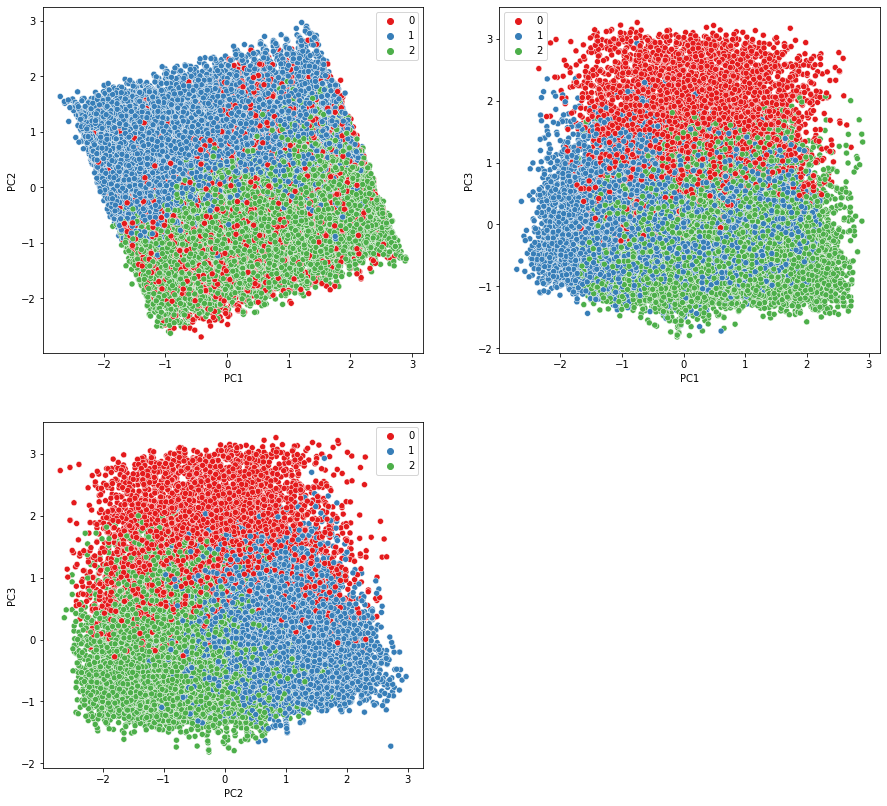

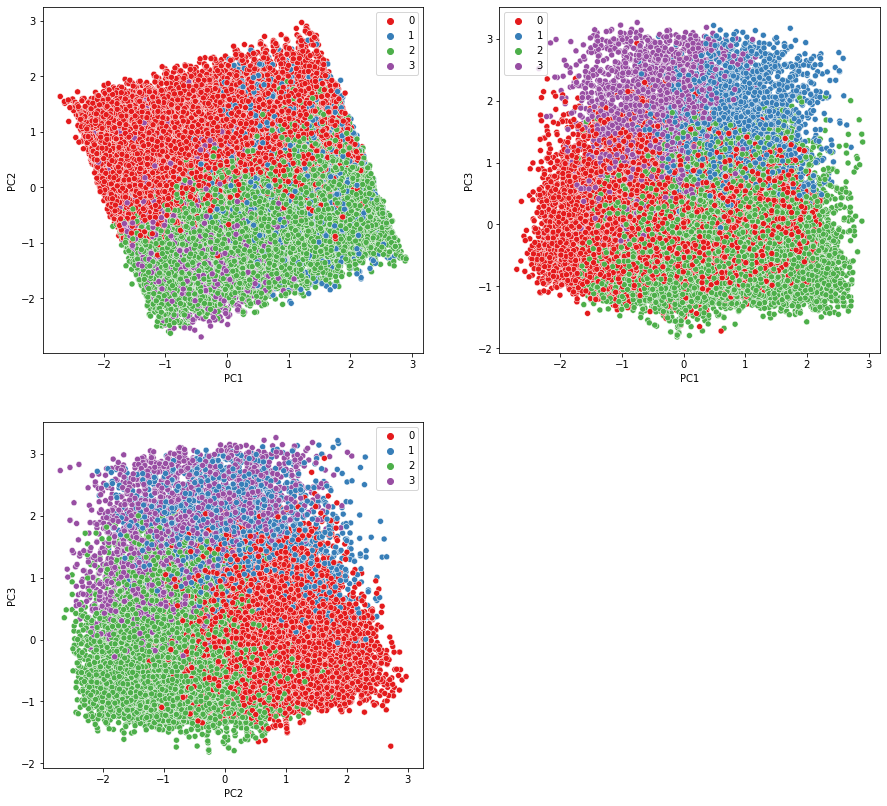

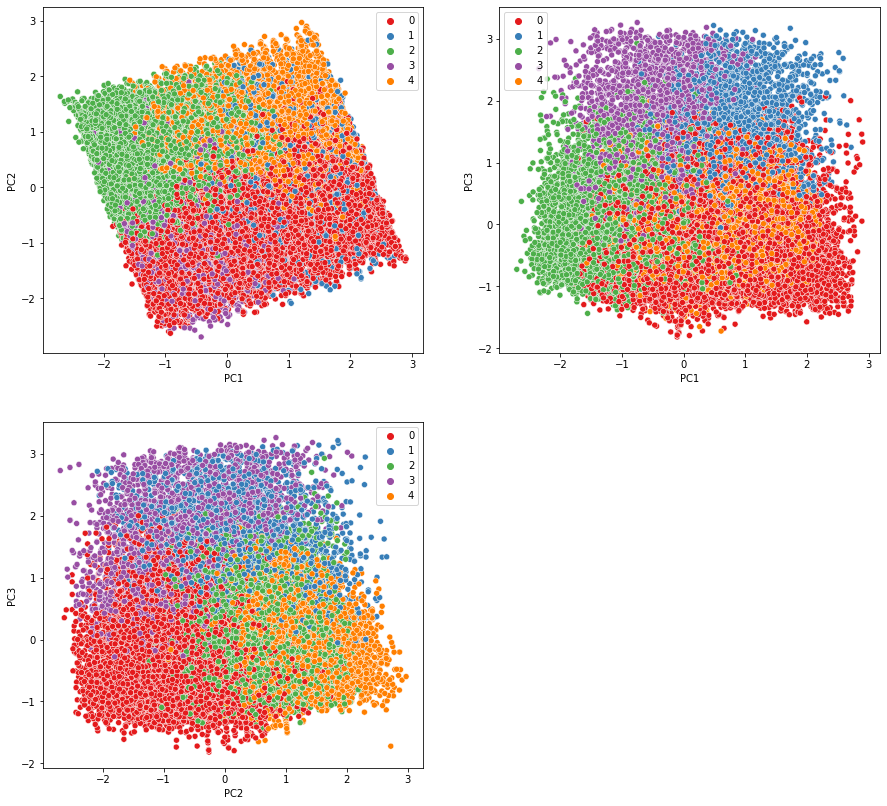

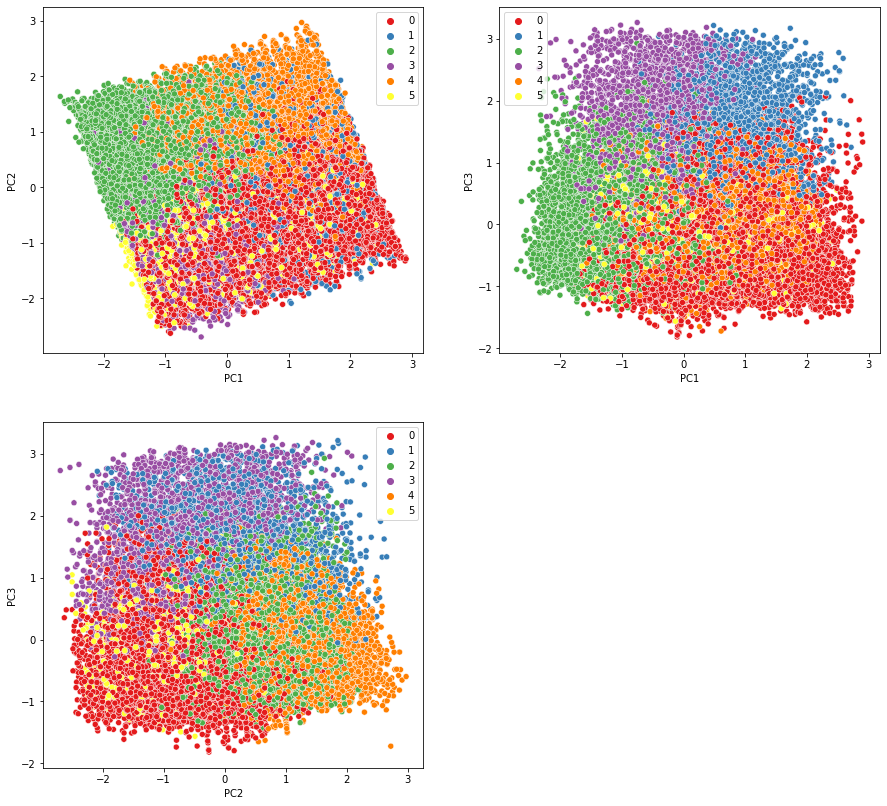

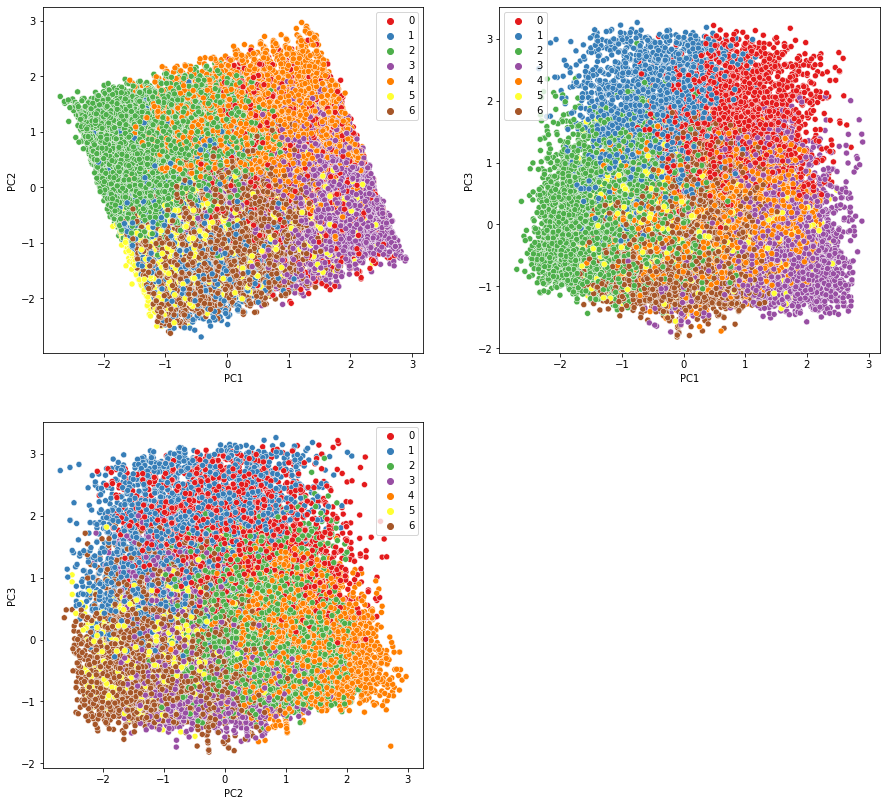

In [6]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_pca(Clusters)

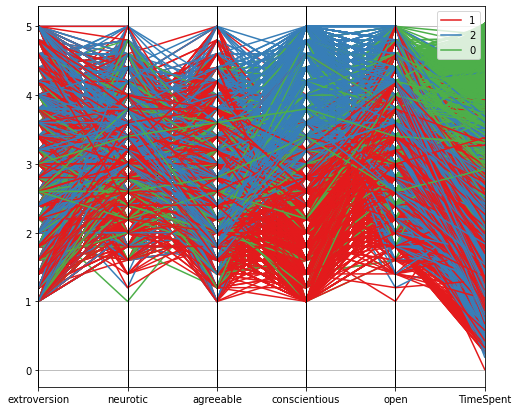

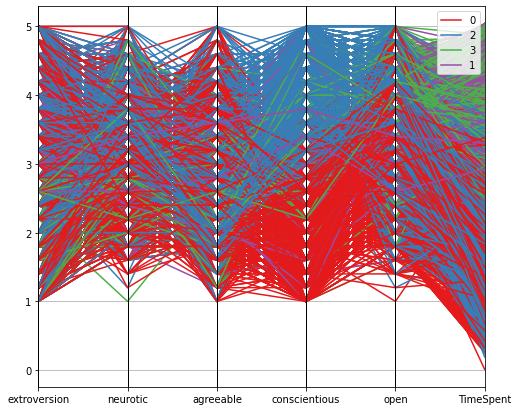

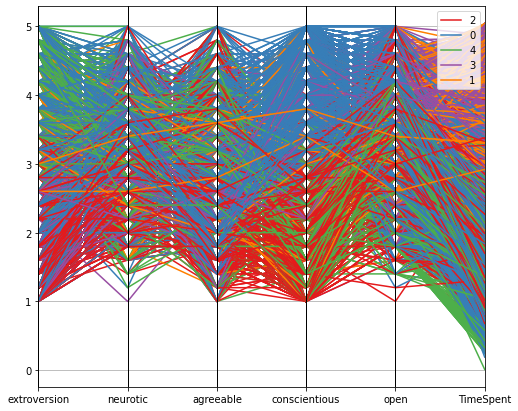

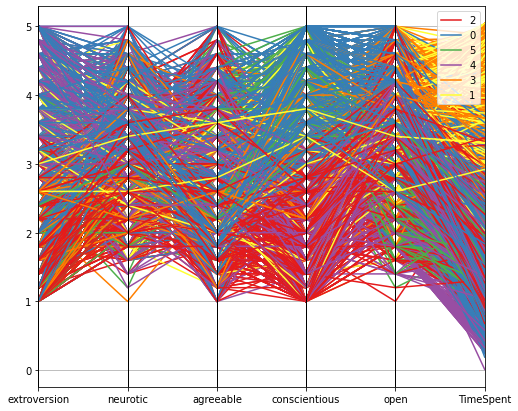

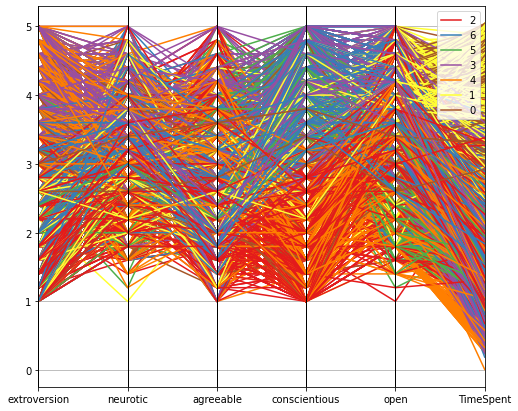

In [7]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_parallel_coordinates(Clusters)

In [8]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_mean_values(Clusters)

   extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0      2.771567  3.161604   2.581357       3.161777  3.660996   3.464992
1      2.669419  3.102487   2.628820       2.364479  3.692530   1.785504
2      2.946804  3.341566   2.482309       3.788900  3.731359   1.783295
   extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0      2.669419  3.102487   2.628820       2.364479  3.692530   1.785504
1      3.618796  3.159692   2.669824       2.918722  3.588399   3.493106
2      2.946804  3.341566   2.482309       3.788900  3.731359   1.783295
3      2.011656  3.163319   2.502009       3.379783  3.726111   3.439776
   extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0      2.946804  3.341566   2.482309       3.788900  3.731359   1.783295
1      3.618796  3.159692   2.669824       2.918722  3.588399   3.493106
2      2.116319  3.092032   2.518227       2.365048  3.711174   1.790359
3      2.011656  3.163319   2.502009       3.379783

In [9]:
# Comparing silhouette values

for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_silhouette_scores(Clusters, i)

Silhouette Score: 0.138
Silhouette mean for each cluster: [0.09225881079798974, 0.1288407027208675, 0.1612163548062271]
Std of silhouette mean: 0.028169251440094408
Number of negative silhouette values: 7791
Silhouette Score: 0.120
Silhouette mean for each cluster: [0.1056432787473117, 0.1418540082618065, 0.13618362628852126, 0.0947027875018439]
Std of silhouette mean: 0.01990551893622396
Number of negative silhouette values: 9630
Silhouette Score: 0.094
Silhouette mean for each cluster: [0.08236049941772212, 0.10073555294522094, 0.12233481766588038, 0.07436872059764571, 0.08599697620594556]
Std of silhouette mean: 0.016909224051883862
Number of negative silhouette values: 13119
Silhouette Score: 0.063
Silhouette mean for each cluster: [0.024030913515963405, 0.09639976134880666, 0.09841776453985891, 0.04641283223804776, 0.08034491801858128, 0.09349956384006516]
Std of silhouette mean: 0.028202945066664292
Number of negative silhouette values: 16312
Silhouette Score: 0.060
Silhouette me

In [10]:
# CHS

from sklearn.metrics import calinski_harabasz_score

for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    print(calinski_harabasz_score(df_model,Clusters))

7060.099078224941
5409.795171611431
5589.633806507477
4804.8569830580045
4821.658691716568


In [11]:
# DBI

from sklearn.metrics import davies_bouldin_score

for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    print(davies_bouldin_score(df_model, Clusters))

1.948825846630945
1.9323835720872766
1.868484290143846
2.0894063537047973
2.208839681932301


In [12]:
# Best Clustering Cut with height that provides 3 clusters

import time

t0 = time.time()
AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete', distance_threshold =None).fit(df_model)
t_agnes_complete = time.time() - t0
print("AGNES with complete linkage required", t_agnes_complete, "seconds")

AGNES with complete linkage required 122.01897287368774 seconds


# AGNES - WardLinkage

In [ ]:
from sklearn.cluster import AgglomerativeClustering
# Dendrogram for WardLinkage
AGNES = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='ward',distance_threshold =0)
model = AGNES.fit(df_model)
plot_dendrogram(model, truncate_mode="lastp", p=6)

In [14]:
# Choosing the range of cuts to eplore
Ks = range(3,8)

In [15]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_clusters_size(Clusters)

{0: 23452, 1: 16520, 2: 6903}
{0: 16520, 1: 14973, 2: 6903, 3: 8479}
{0: 6903, 1: 14973, 2: 11348, 3: 8479, 4: 5172}
{0: 14973, 1: 8479, 2: 11348, 3: 3444, 4: 5172, 5: 3459}
{0: 11348, 1: 8479, 2: 11204, 3: 3444, 4: 5172, 5: 3459, 6: 3769}


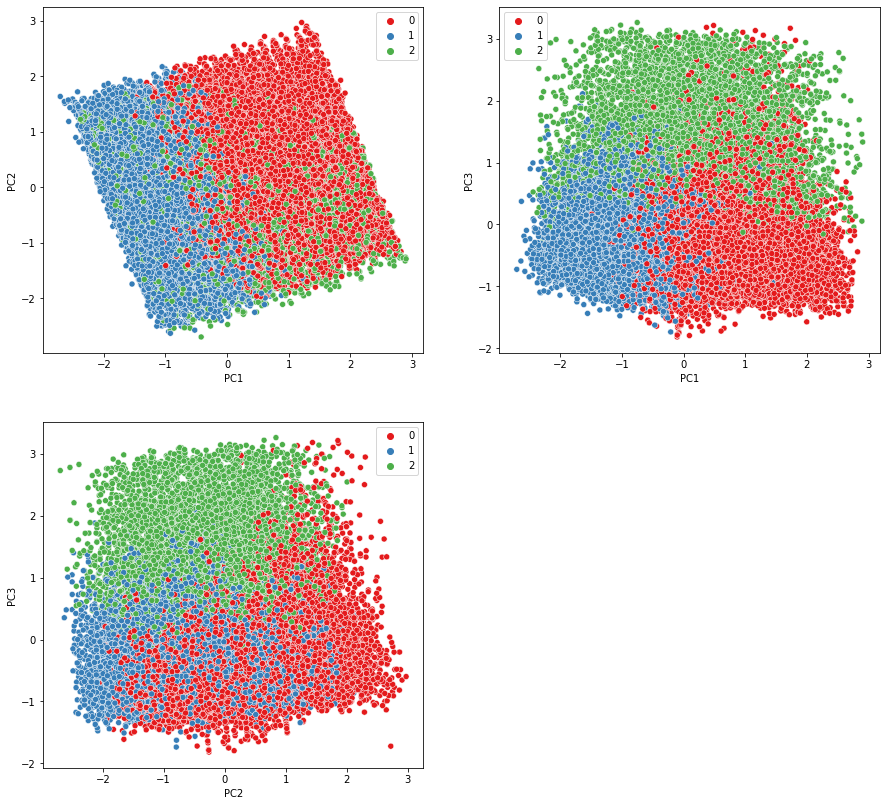

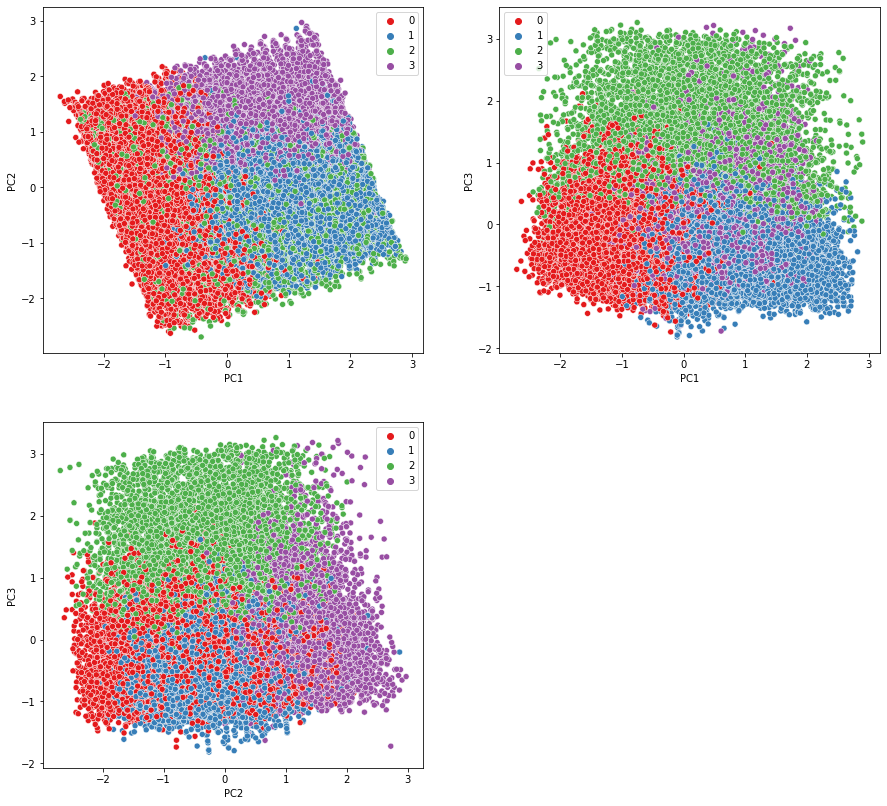

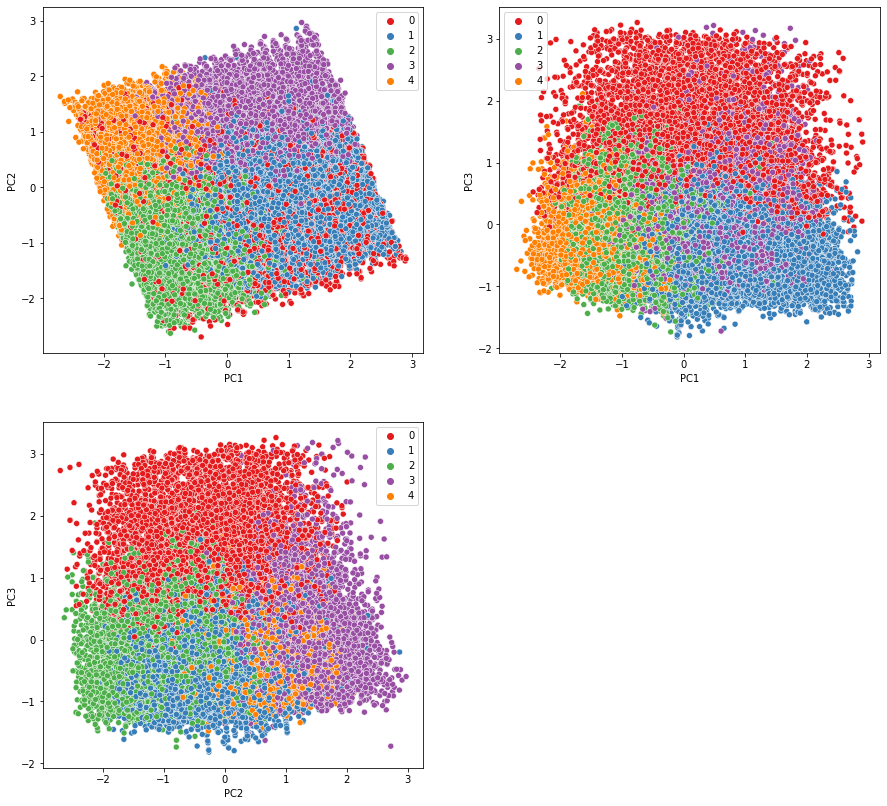

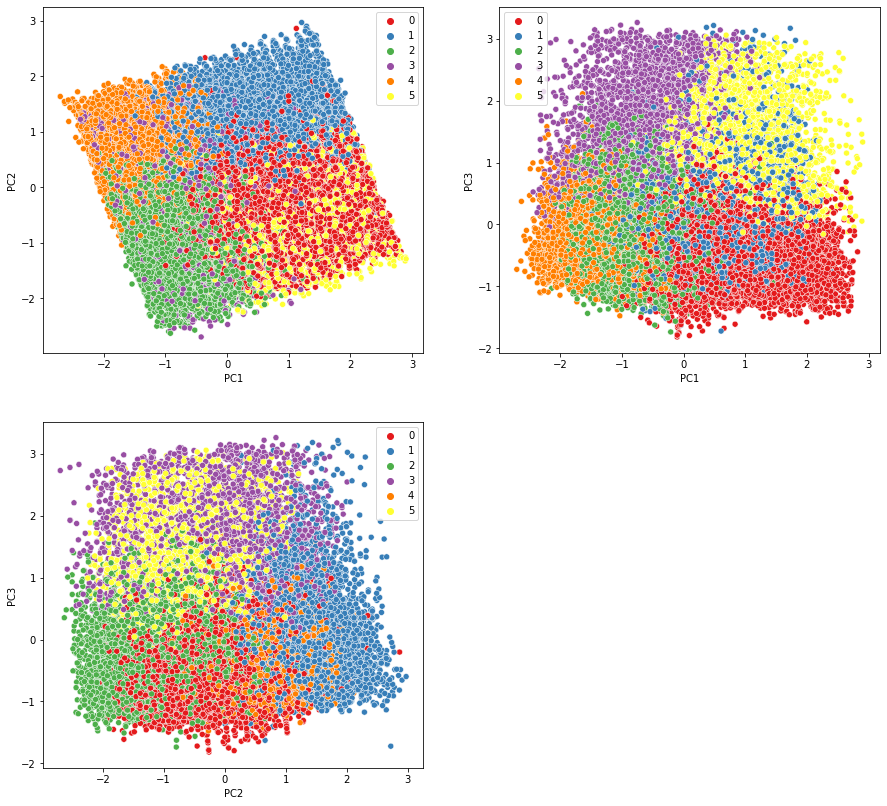

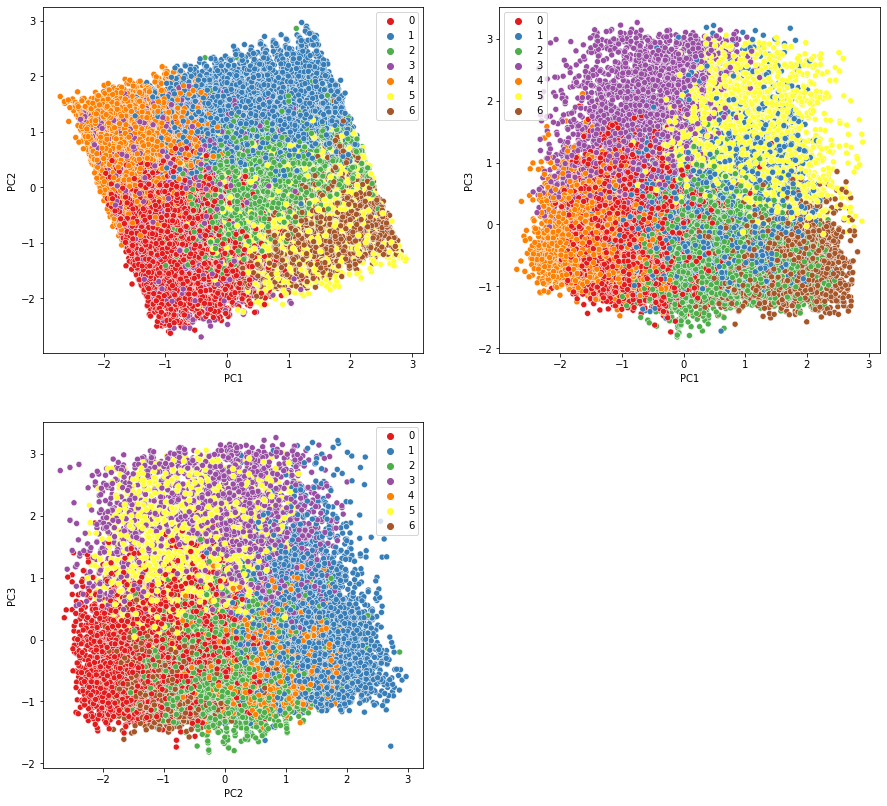

In [16]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_pca(Clusters)

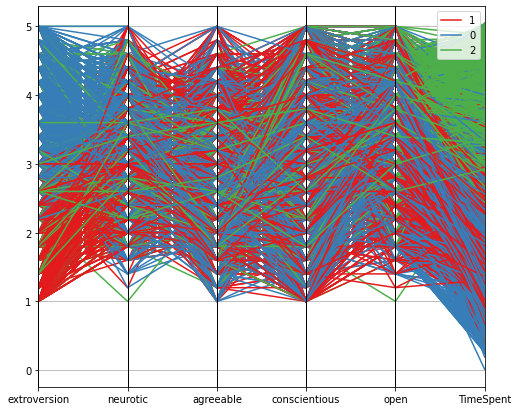

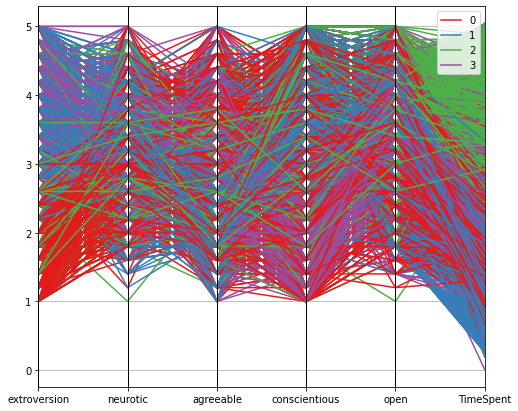

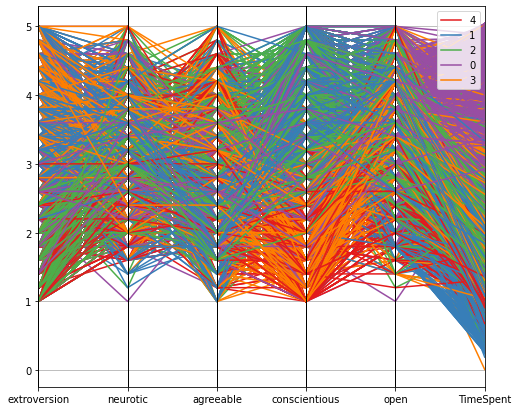

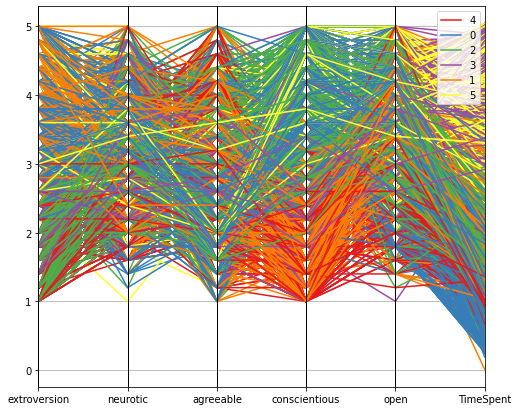

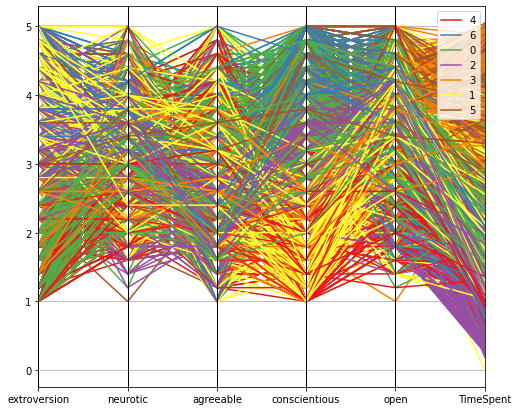

In [17]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_parallel_coordinates(Clusters)

In [18]:
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_mean_values(Clusters)

   extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0      3.436500  3.248397   2.518753       3.032065  3.737583   1.750147
1      1.876538  3.165811   2.613002       3.086719  3.660605   1.753679
2      2.856323  3.202897   2.573055       3.194003  3.702970   3.376975
   extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0      1.876538  3.165811   2.613002       3.086719  3.660605   1.753679
1      3.379430  3.282402   2.401095       3.545796  3.709611   1.675563
2      2.856323  3.202897   2.573055       3.194003  3.702970   3.376975
3      3.537280  3.188348   2.726524       2.124873  3.786980   1.881854
   extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0      2.856323  3.202897   2.573055       3.194003  3.702970   3.376975
1      3.379430  3.282402   2.401095       3.545796  3.709611   1.675563
2      1.893268  3.244149   2.554142       3.544272  3.700864   1.842898
3      3.537280  3.188348   2.726524       2.124873

In [19]:
# Comparing silhouette values
for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    show_silhouette_scores(Clusters, i)

Silhouette Score: 0.145
Silhouette mean for each cluster: [0.1388720791357864, 0.17675788524021369, 0.09159774475160767]
Std of silhouette mean: 0.03483683638476266
Number of negative silhouette values: 7987
Silhouette Score: 0.119
Silhouette mean for each cluster: [0.11577373470030042, 0.1408189527852503, 0.05276928112062311, 0.1433578381452265]
Std of silhouette mean: 0.03650615030852368
Number of negative silhouette values: 10426
Silhouette Score: 0.098
Silhouette mean for each cluster: [0.02578591245235636, 0.10734355212379046, 0.0863293023882944, 0.09387537667885315, 0.20212822480424075]
Std of silhouette mean: 0.05686548138617107
Number of negative silhouette values: 12489
Silhouette Score: 0.096
Silhouette mean for each cluster: [0.08430409894189399, 0.08685091994673859, 0.07969383748511705, 0.045373473477253505, 0.19873725222123936, 0.11628636905910089]
Std of silhouette mean: 0.04797372453775992
Number of negative silhouette values: 12468
Silhouette Score: 0.080
Silhouette mea

In [20]:
# CHS

from sklearn.metrics import calinski_harabasz_score

for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    print(calinski_harabasz_score(df_model,Clusters))

7748.126507982476
7474.303469952153
7052.702503575621
6435.085102306713
5975.208263258218


In [21]:
# DBI

from sklearn.metrics import davies_bouldin_score

for i in Ks:
    AGNES = AgglomerativeClustering(n_clusters=i, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
    Clusters = AGNES.labels_
    print(davies_bouldin_score(df_model, Clusters))

1.8783332592292714
1.7662382963820555
1.7540121559235573
1.7686488349529965
1.8845579459280428


In [22]:
# Best Clustering Cut with height that provides 3 clusters 

t0 = time.time()
AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward', distance_threshold =None).fit(df_model)
t_agnes_ward = time.time() - t0
print("AGNES with complete linkage required", t_agnes_ward, "seconds")

AGNES with complete linkage required 148.24994707107544 seconds


# BIRCH

In [24]:
# Exploring different ranges for radius threshold and branching factor

from sklearn.cluster import Birch

for i in [1.5,1.6,1.7,1.8]:
    for j in (2,3,4):
        BIRCH=Birch(branching_factor=j, n_clusters = None, threshold=i).fit(df_model)
        Clusters = BIRCH.predict(df_model)
        unique, counts = np.unique(Clusters, return_counts=True)
        print("For RadiusThreshold =",i,"and L =",j,"we have:",dict(zip(unique, counts)))

For RadiusThreshold = 1.5 and L = 2 we have: {0: 1370, 1: 1502, 2: 7764, 3: 2583, 4: 2243, 5: 6364, 6: 5164, 7: 7211, 8: 3228, 9: 4276, 10: 2801, 11: 2369}
For RadiusThreshold = 1.5 and L = 3 we have: {0: 5880, 1: 4617, 2: 3442, 3: 4529, 4: 3207, 5: 1601, 6: 2634, 7: 2972, 8: 7124, 9: 4974, 10: 2894, 11: 3001}
For RadiusThreshold = 1.5 and L = 4 we have: {0: 6137, 1: 4174, 2: 4475, 3: 3957, 4: 5073, 5: 4369, 6: 1577, 7: 1673, 8: 1122, 9: 1854, 10: 1439, 11: 1357, 12: 1490, 13: 8178}
For RadiusThreshold = 1.6 and L = 2 we have: {0: 4269, 1: 6136, 2: 4547, 3: 6452, 4: 2682, 5: 4608, 6: 3272, 7: 2526, 8: 4206, 9: 8177}
For RadiusThreshold = 1.6 and L = 3 we have: {0: 4847, 1: 3459, 2: 5791, 3: 6864, 4: 3837, 5: 8369, 6: 3817, 7: 3782, 8: 6109}
For RadiusThreshold = 1.6 and L = 4 we have: {0: 10322, 1: 10712, 2: 4112, 3: 9095, 4: 8998, 5: 3636}
For RadiusThreshold = 1.7 and L = 2 we have: {0: 12053, 1: 12768, 2: 11294, 3: 10760}
For RadiusThreshold = 1.7 and L = 3 we have: {0: 12283, 1: 12

In [25]:
# Choosing the range of parameters to eplore
RadiusThresholdRange = [1.5,1.6,1.7,1.8]
L = 4

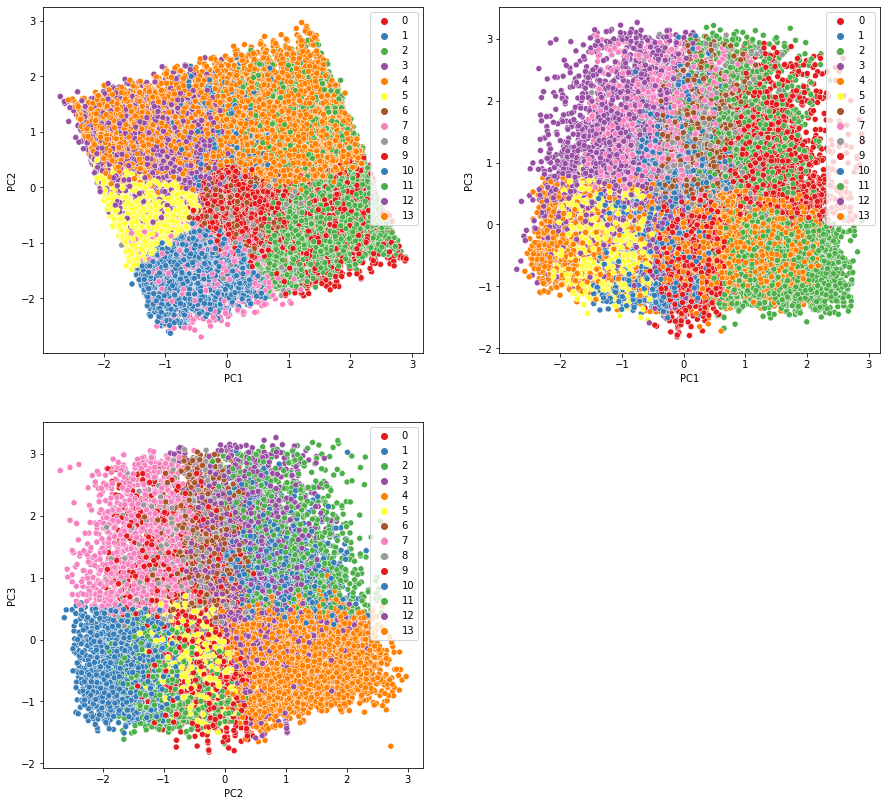

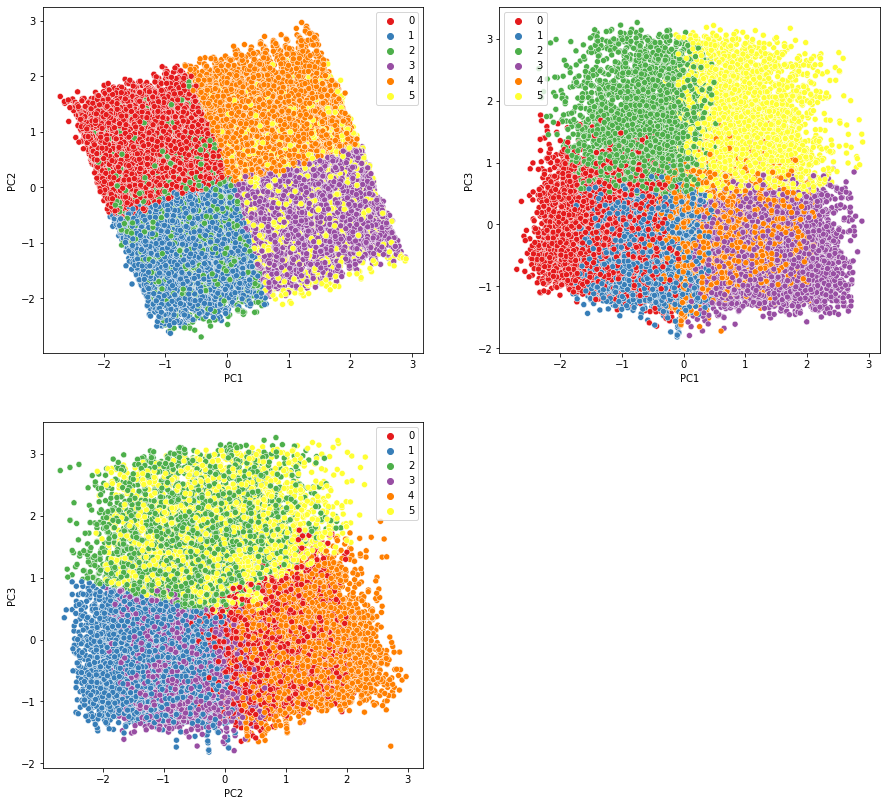

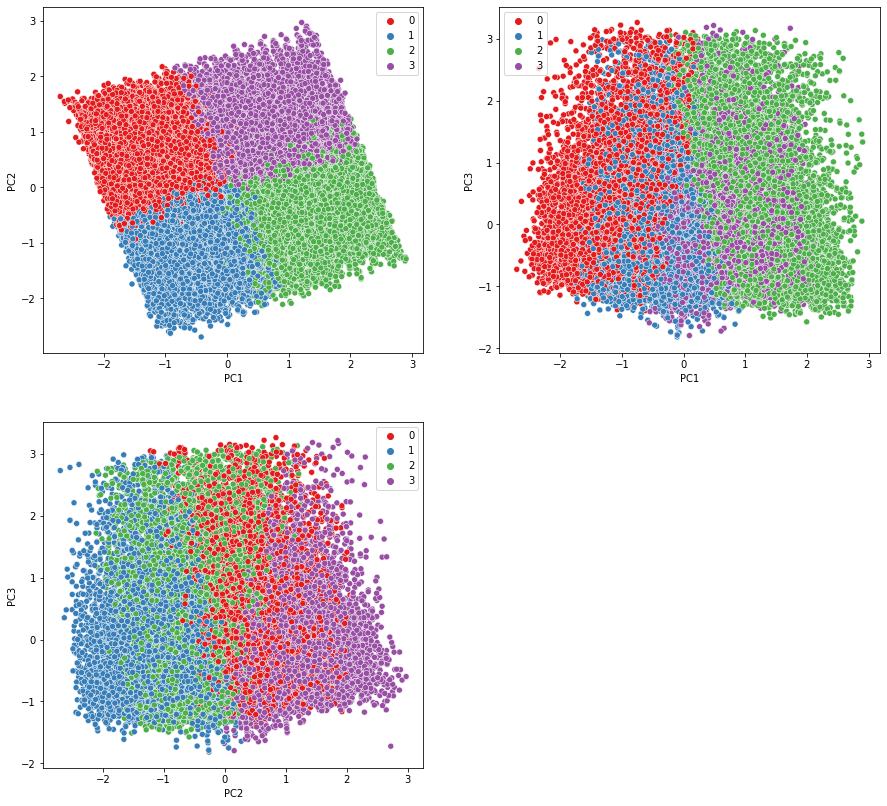

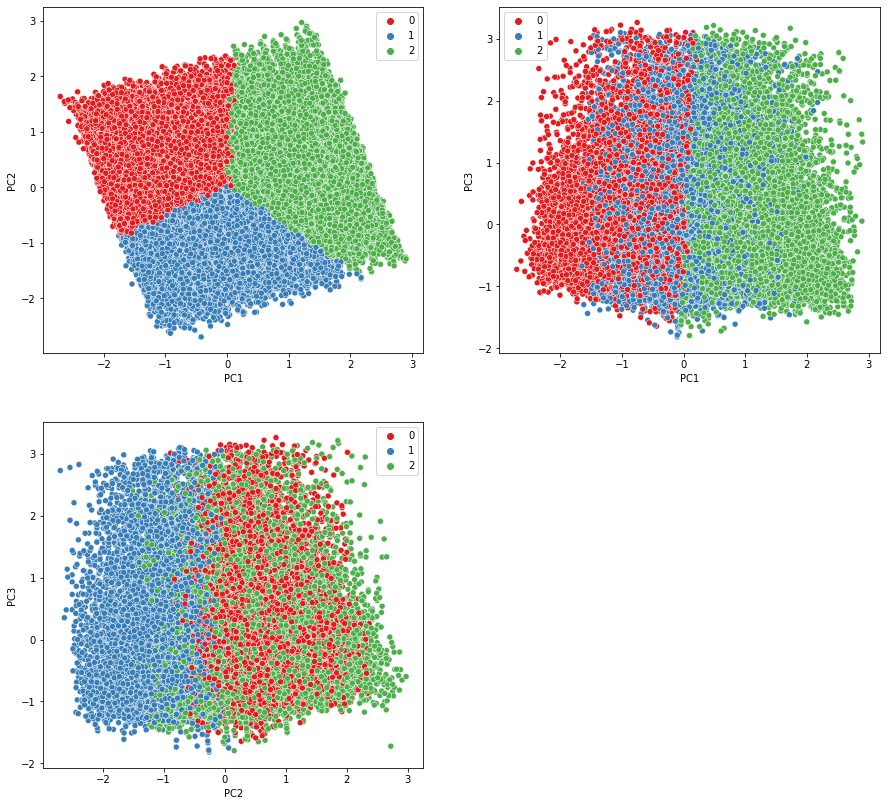

In [26]:
for i in RadiusThresholdRange:
    BIRCH=Birch(branching_factor=L, n_clusters = None, threshold=i).fit(df_model)
    Clusters = BIRCH.predict(df_model)
    show_pca(Clusters)

In [27]:
# Comparing silhouette values
for i in RadiusThresholdRange:
    BIRCH=Birch(branching_factor=L, n_clusters = None, threshold=i)
    BIRCH.fit(df_model)
    Clusters = BIRCH.predict(df_model)
    unique, counts = np.unique(Clusters, return_counts=True)
    palette = sns.color_palette('Set1', len(unique))
    print("For threshold = %.1f we have:" % (i))
    show_silhouette_scores(Clusters,len(unique))

For threshold = 1.5 we have:
Silhouette Score: 0.119
Silhouette mean for each cluster: [0.15078439922813475, 0.11621726398634719, 0.1600466014104661, 0.049458677143171245, 0.1402042794814733, 0.14072564950074715, 0.13002537619490942, 0.08259238903661607, 0.06459342132954309, 0.09832667844629628, 0.11376949321304626, 0.08228390261054414, 0.0906385698618029, 0.11467736031677195]
Std of silhouette mean: 0.03190987890387851
Number of negative silhouette values: 5975
For threshold = 1.6 we have:
Silhouette Score: 0.167
Silhouette mean for each cluster: [0.17792427542531253, 0.17289505584682316, 0.11127765189551754, 0.19175607256753405, 0.17149056562604154, 0.11297336285457076]
Std of silhouette mean: 0.03197670063736144
Number of negative silhouette values: 1134
For threshold = 1.7 we have:
Silhouette Score: 0.161
Silhouette mean for each cluster: [0.14707062043844613, 0.18176091033214592, 0.12198865007389478, 0.19087432096814688]
Std of silhouette mean: 0.02755936618774614
Number of negati

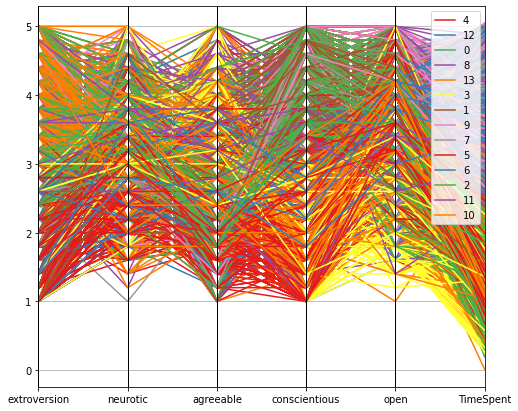

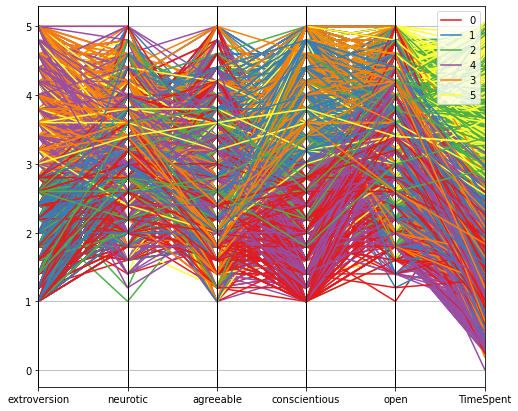

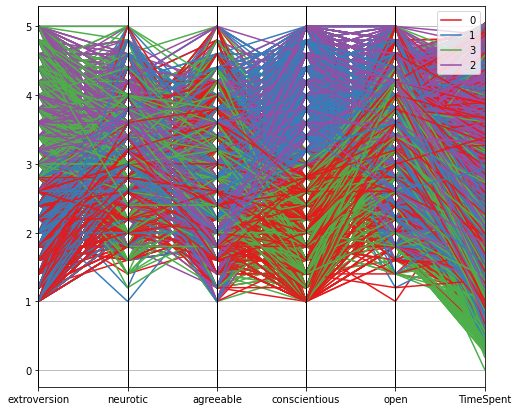

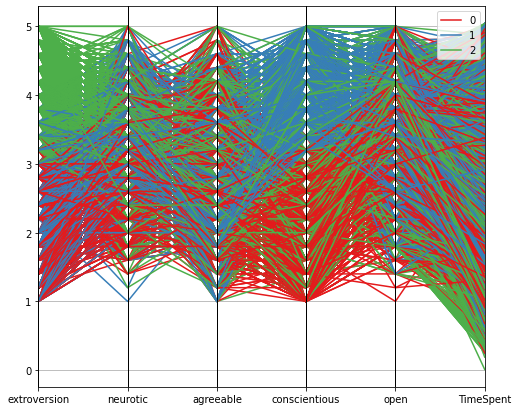

In [28]:
for i in RadiusThresholdRange:
    BIRCH=Birch(branching_factor=4, n_clusters = None, threshold=i)
    BIRCH.fit(df_model)
    Clusters = BIRCH.predict(df_model)
    show_parallel_coordinates(Clusters)

In [29]:
for i in RadiusThresholdRange:
    BIRCH=Birch(branching_factor=4, n_clusters = None, threshold=i)
    BIRCH.fit(df_model)
    Clusters =  BIRCH.predict(df_model)
    show_mean_values(Clusters)

    extroversion  neurotic  agreeable  conscientious      open  TimeSpent
0       2.836695  3.262148   2.554636       3.499919  3.645657   1.632467
1       1.874940  3.366842   2.407475       4.276905  3.737997   1.701337
2       3.850547  3.424134   2.310972       4.238212  3.825385   1.620051
3       2.209856  3.127066   3.132575       2.336871  3.314632   1.821708
4       2.103371  3.005165   2.334713       1.939602  3.898640   1.530477
5       1.539620  3.141314   2.576745       3.147723  3.670771   1.624813
6       2.869245  3.266075   2.244769       3.190361  3.607736   3.199341
7       1.975254  3.261327   2.433473       3.952301  3.714525   3.473299
8       2.874866  3.257576   3.400178       3.707843  3.462389   3.012540
9       3.929126  3.343474   2.368716       3.967314  3.856526   3.042648
10      3.044197  3.007505   2.936901       2.234607  3.603058   2.870883
11      4.073397  3.215328   2.544878       2.240236  3.794105   3.395461
12      1.854228  3.090872   2.598389 

In [30]:
# CHS

from sklearn.metrics import calinski_harabasz_score

for i in RadiusThresholdRange:
    BIRCH=Birch(branching_factor=4, n_clusters = None, threshold=i)
    BIRCH.fit(df_model)
    Clusters =  BIRCH.predict(df_model)
    print(calinski_harabasz_score(df_model,Clusters))

5087.647791281732
9154.41488996018
9992.607293192323
11149.707683917823


In [31]:
# DBI

from sklearn.metrics import davies_bouldin_score

for i in RadiusThresholdRange:
    BIRCH=Birch(branching_factor=4, n_clusters = None, threshold=i)
    BIRCH.fit(df_model)
    Clusters =  BIRCH.predict(df_model)
    print(davies_bouldin_score(df_model, Clusters))

1.8159482418474364
1.607006551387804
1.7007745494353759
1.643328430575961


In [32]:
# Best parameters for BIRCH: L = 4 and R = 1.8
t0 = time.time()
BIRCH=Birch(branching_factor=4, n_clusters = None, threshold=1.8)
BIRCH.fit(df_model)
t_birch = time.time() - t0
print("BIRCH with complete linkage required", t_birch, "seconds")

BIRCH with complete linkage required 0.8879539966583252 seconds
